In [1]:
import torch
from torchvision import models, transforms, datasets
from torch. utils.data import DataLoader
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Paths
train_path = "/Users/achuthreddybangaru/Desktop/FDS/Project/train"
test_path = "/Users/achuthreddybangaru/Desktop/FDS/Project/test"

# Transformation for pretrained model
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],  
        std=[0.229, 0.224, 0.225]    
    )
])
train_dataset = datasets.ImageFolder(train_path, transform=transform)
test_dataset = datasets.ImageFolder(test_path, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

model = models.resnet50(pretrained=True)
feature_extractor = torch.nn.Sequential(*(list(model.children())[:-1]))
feature_extractor.eval()

device =  "cpu"
feature_extractor = feature_extractor.to(device)

def extract_features(dataloader):
    features = []
    labels = []
    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs = inputs.to(device)
            outputs = feature_extractor(inputs)
            outputs = outputs.view(outputs.size(0), -1) 
            features.append(outputs.cpu().numpy())
            labels.append(targets.cpu().numpy())
    return np.vstack(features), np.hstack(labels)
X_train, y_train = extract_features(train_loader)
X_test, y_test = extract_features(test_loader)

clf = LogisticRegression(max_iter=1000, class_weight='balanced')
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred, target_names=test_dataset.classes))

/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


                    precision    recall  f1-score   support

collapsed_building       0.91      0.91      0.91       103
              fire       0.98      0.93      0.96       105
     flooded_areas       0.93      0.92      0.93       106
            normal       0.97      0.97      0.97       878
  traffic_incident       0.87      0.91      0.89        97

          accuracy                           0.96      1289
         macro avg       0.93      0.93      0.93      1289
      weighted avg       0.96      0.96      0.96      1289



In [2]:
import torch.nn.functional as F

resnet_with_grad = models.resnet50(pretrained=True).eval().to(device)

def get_saliency_map(img_tensor, class_idx):
    img_tensor.requires_grad_()
    resnet_with_grad.zero_grad()
    output = resnet_with_grad(img_tensor)
    score = output[0, class_idx]
    score.backward()
    saliency, _ = torch.max(img_tensor.grad.data.abs(), dim=1)
    return saliency.squeeze().cpu().numpy()

/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [3]:
from torchvision.datasets import ImageFolder
import os
class ImageFolderWithPaths(datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super().__getitem__(index)
        path = self.imgs[index][0]
        return original_tuple + (path,)  

from collections import defaultdict

test_dataset = ImageFolderWithPaths(test_path, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

from collections import defaultdict

required_classes = [
    'collapsed_building',
    'fire',
    'flooded_areas',
    'normal',
    'traffic_incident'
]

# Track correct and incorrect examples
correct_by_class = defaultdict(list)
incorrect_by_class = defaultdict(list)

def all_classes_filled(d):
    return all(len(d[class_name]) >= 3 for class_name in required_classes)

with torch.no_grad():
    for img, label, path in test_loader:
        img = img.to(device)
        features = feature_extractor(img)
        features = features.view(features.size(0), -1).cpu().numpy()

        pred = clf.predict(features)[0]

        class_name = test_dataset.classes[label.item()]
        sample = (path[0], label.item(), pred)

        if class_name in required_classes:
            if pred == label.item() and len(correct_by_class[class_name]) < 3:
                correct_by_class[class_name].append(sample)
            elif pred != label.item() and len(incorrect_by_class[class_name]) < 3:
                incorrect_by_class[class_name].append(sample)

        if all_classes_filled(correct_by_class) and all_classes_filled(incorrect_by_class):
            break
import matplotlib.pyplot as plt
from PIL import Image

def plot_with_saliency(img_path, true_label, pred_label):
    img = Image.open(img_path).convert('RGB')
    img_tensor = transform(img).unsqueeze(0).to(device)

    sal_map = get_saliency_map(img_tensor.clone(), pred_label)

    fig, ax = plt.subplots(1, 2, figsize=(10, 4))
    ax[0].imshow(img)
    ax[0].set_title(f"True: {test_dataset.classes[true_label]}\nPred: {test_dataset.classes[pred_label]}")
    ax[0].axis('off')

    ax[1].imshow(sal_map, cmap='hot')
    ax[1].set_title("Saliency Map")
    ax[1].axis('off')
    plt.tight_layout()
    plt.show()

In [7]:
pip install opencv-python


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.3/37.3 MB 50.1 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.



🟢 Correctly classified: collapsed_building


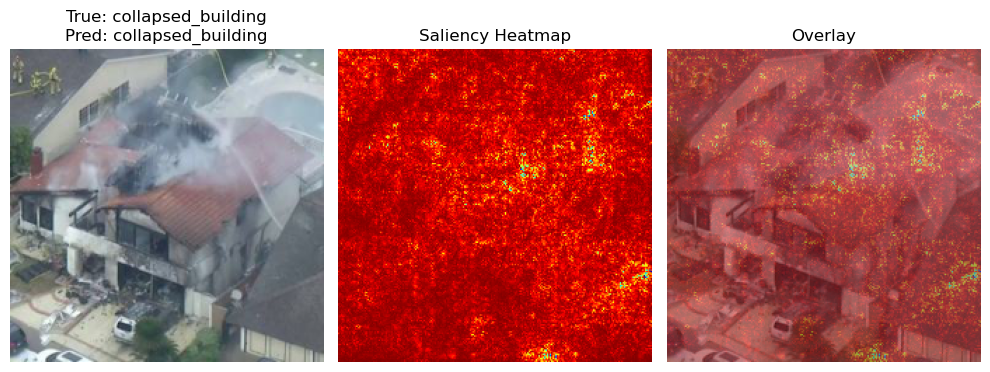

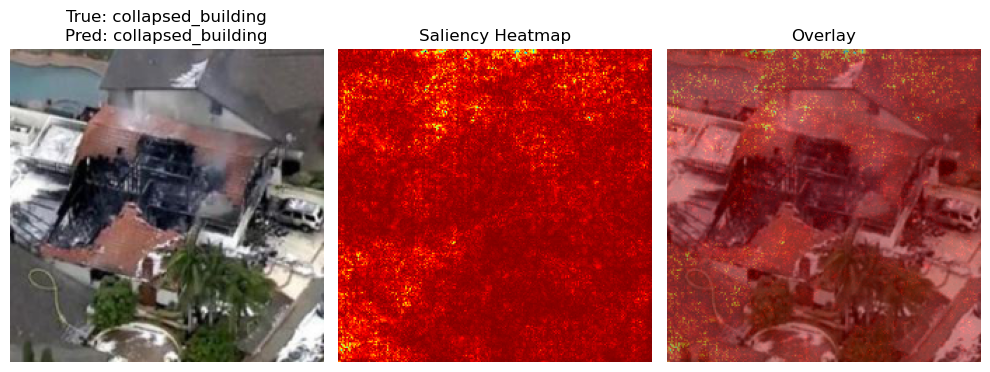

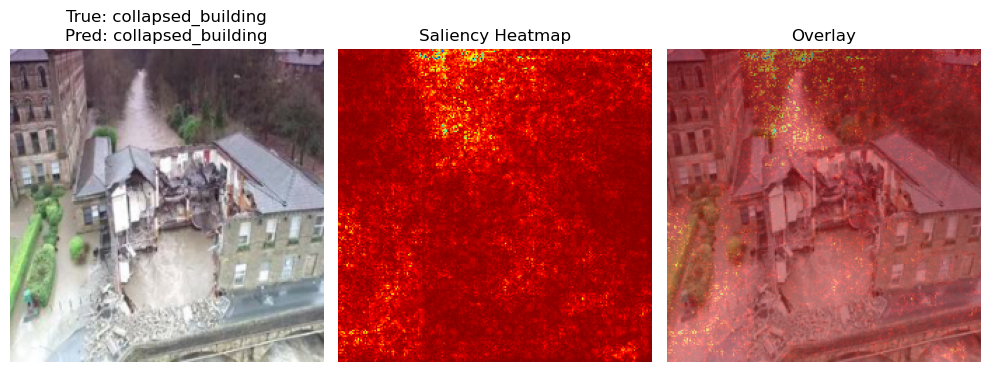


🟢 not Correctly classified: collapsed_building


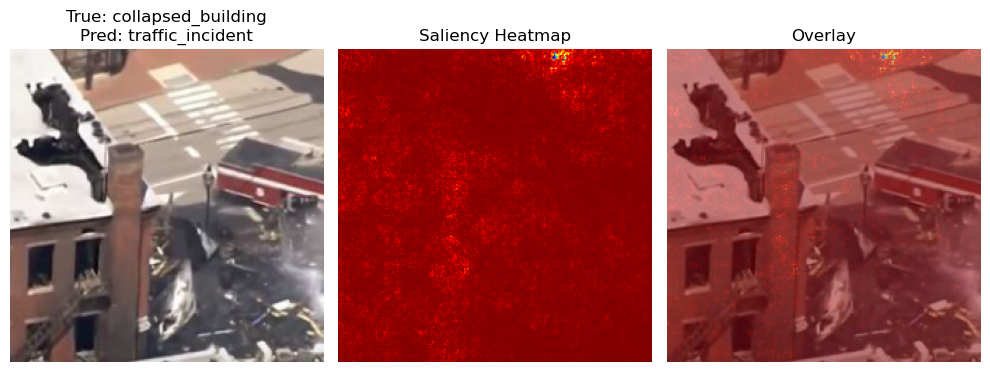

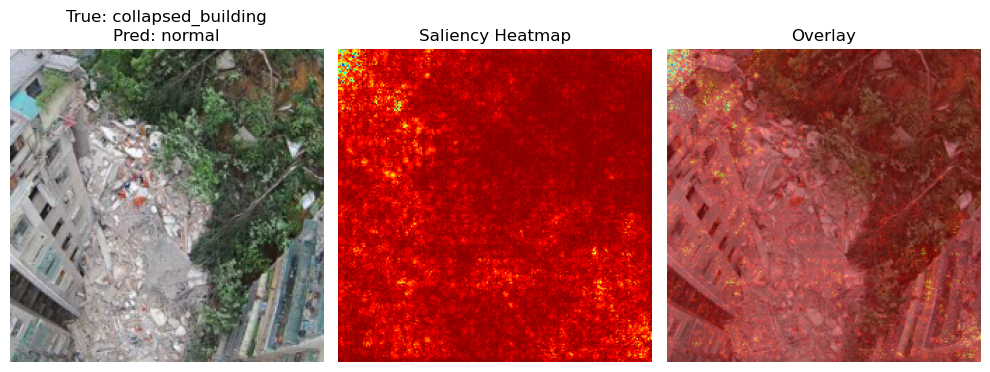

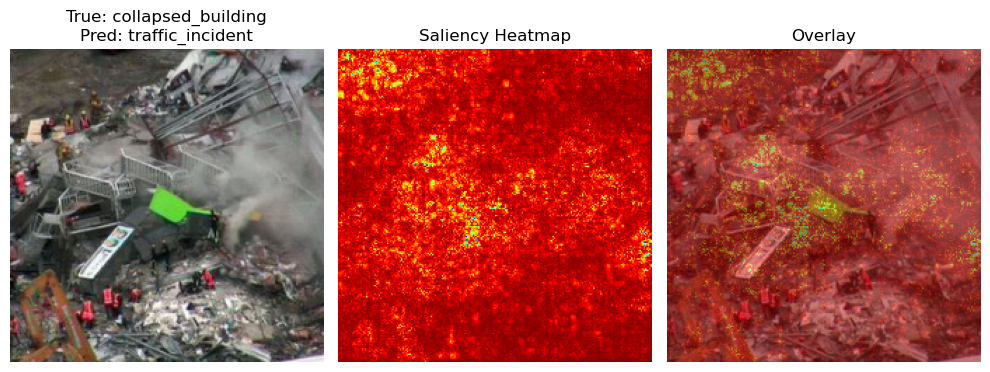


🟢 Correctly classified: fire


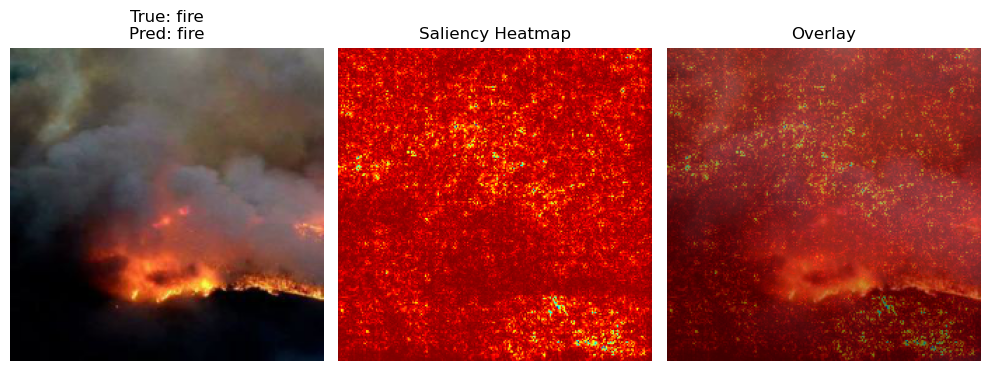

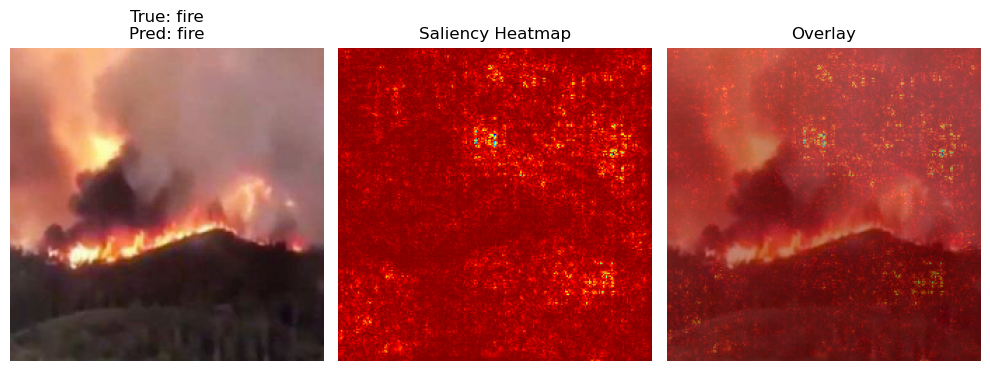

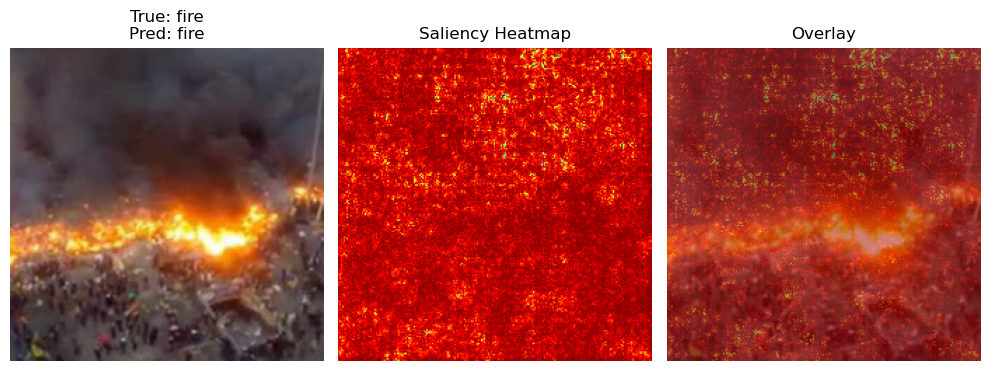


🟢 not Correctly classified: fire


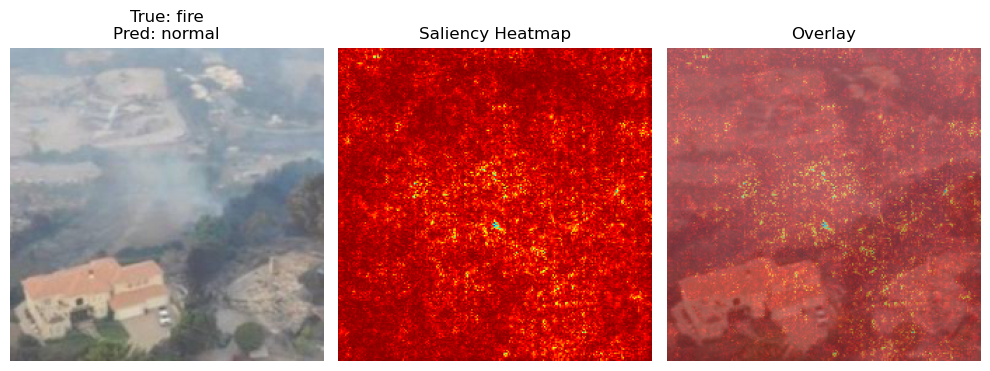

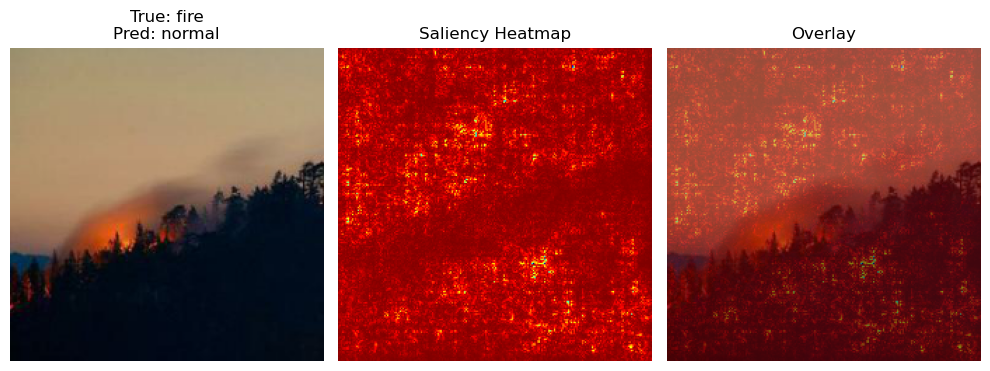

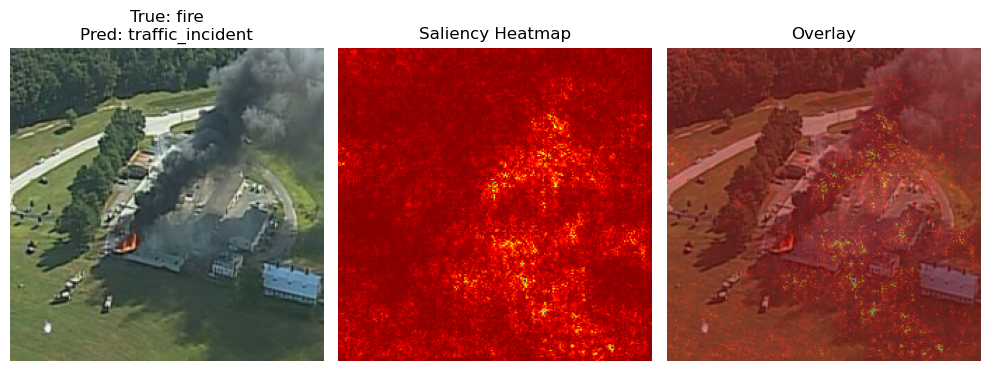


🟢 Correctly classified: flooded_areas


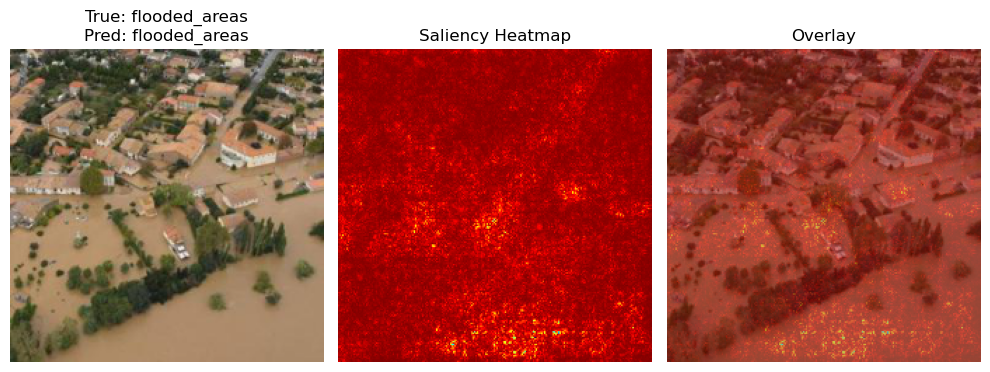

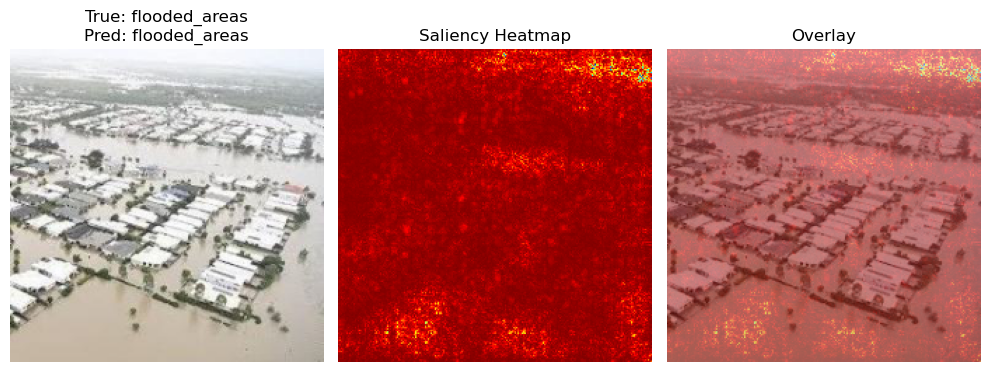

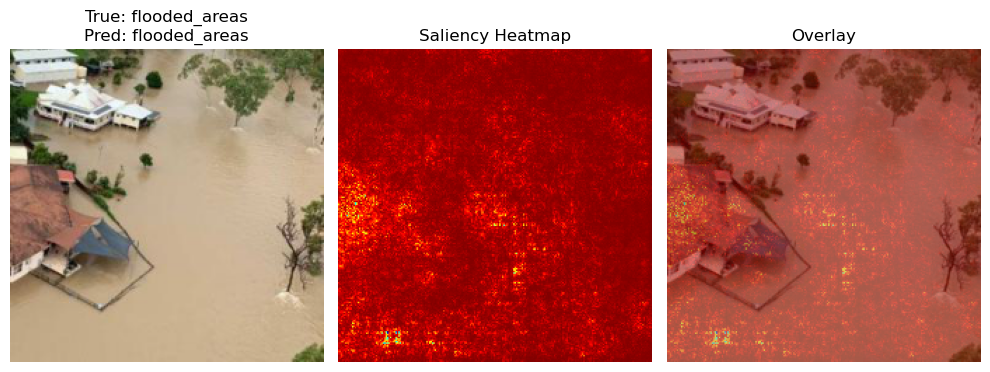


🟢 not Correctly classified: flooded_areas


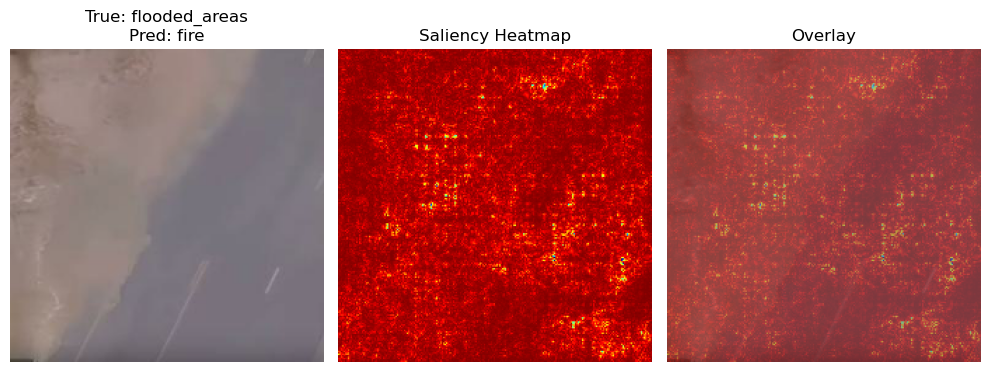

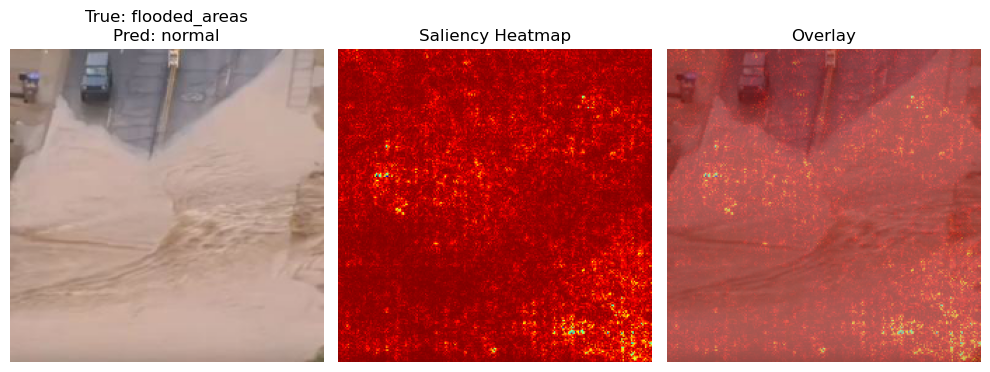

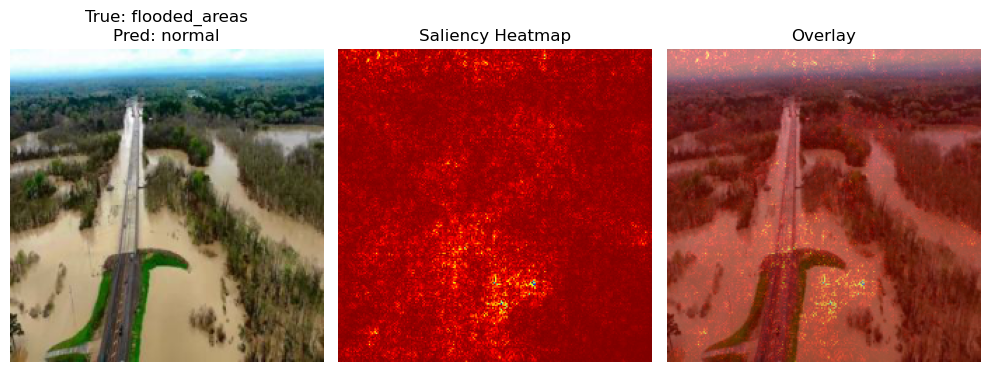


🟢 Correctly classified: normal


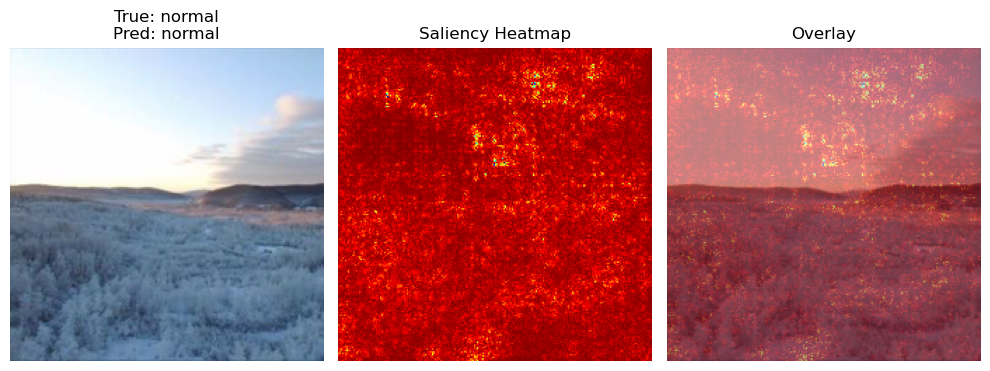

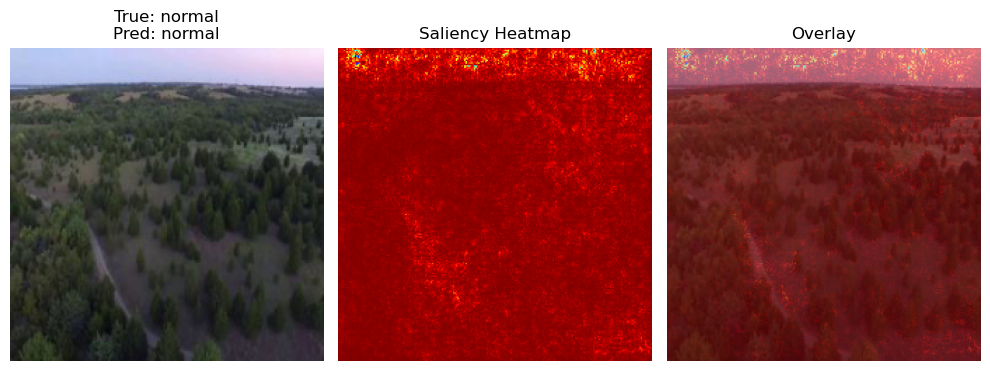

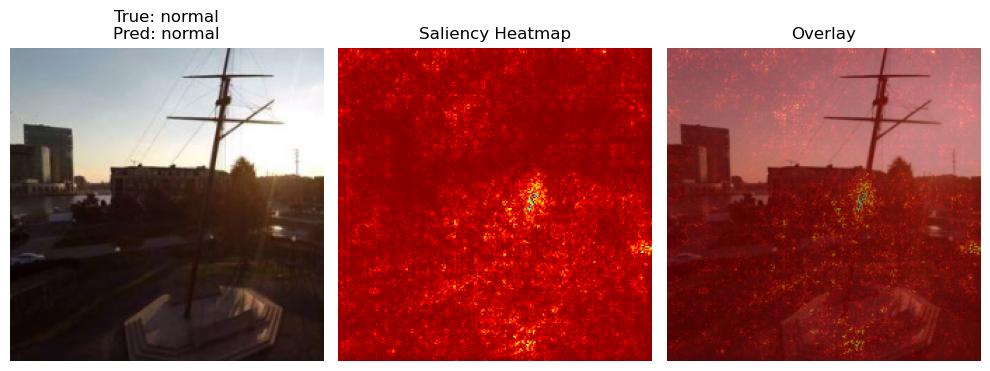


🟢 not Correctly classified: normal


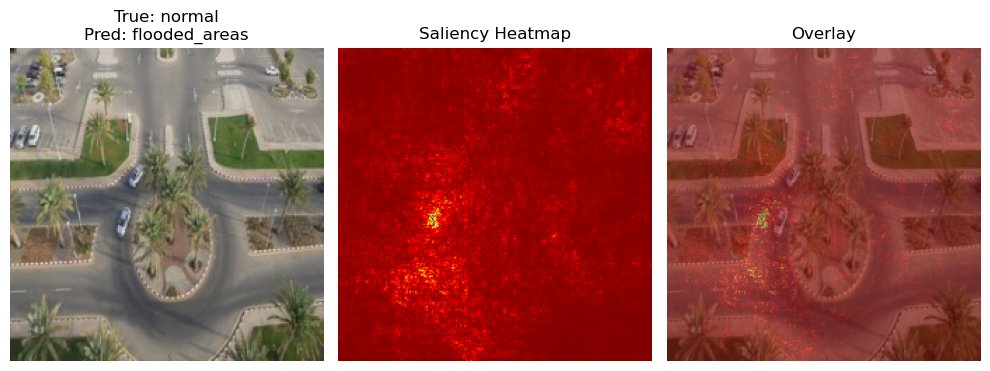

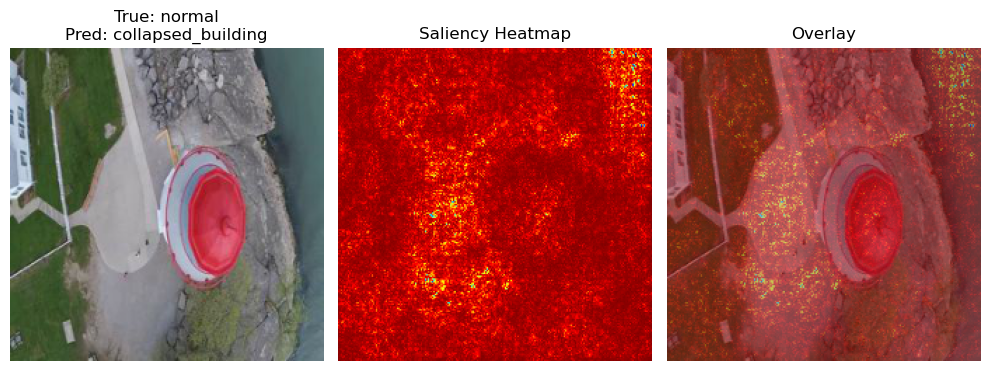

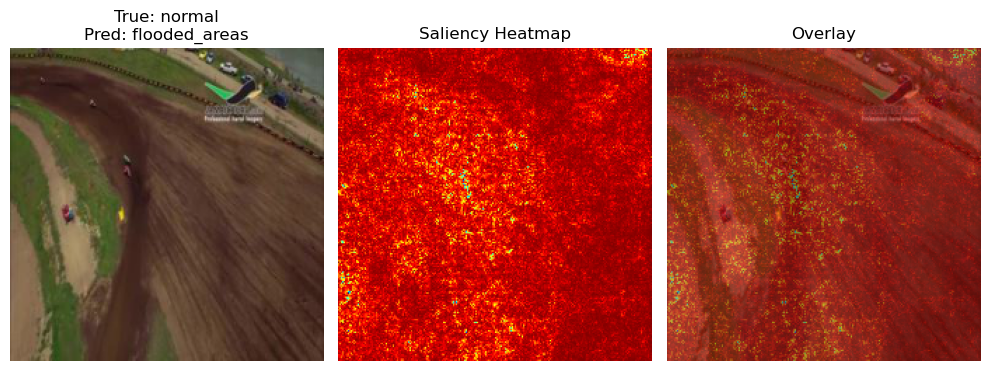


🟢 Correctly classified: traffic_incident


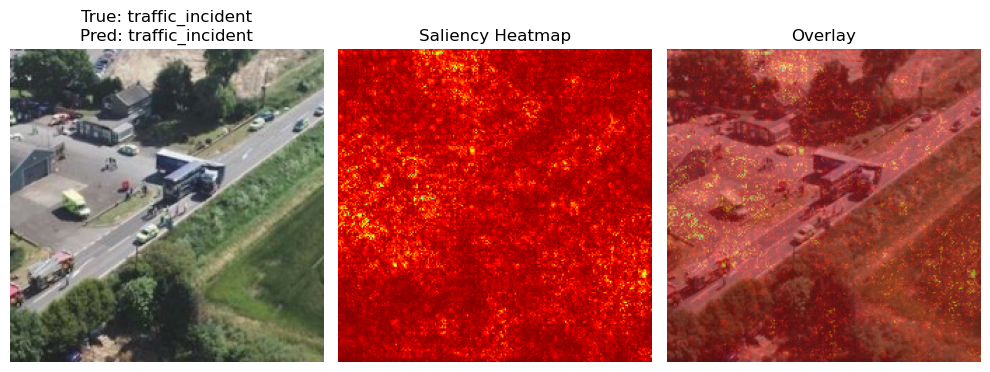

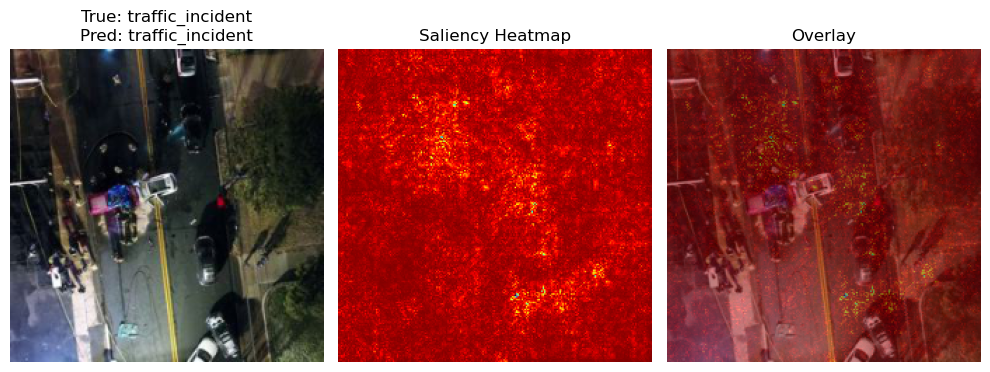

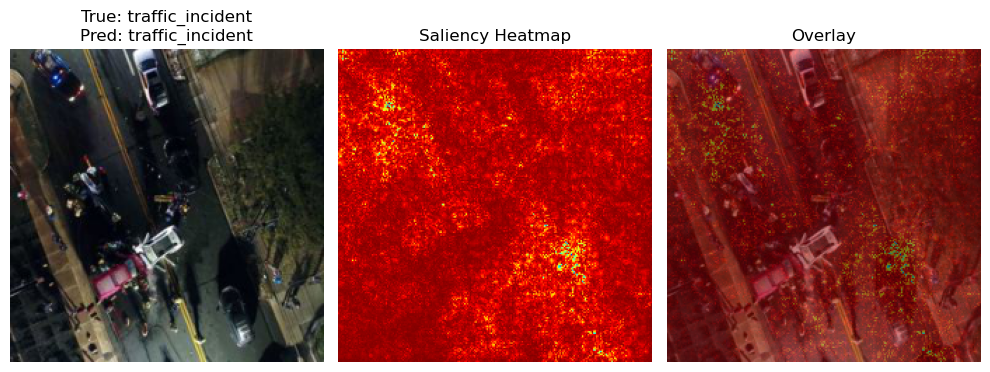


🟢 not Correctly classified: traffic_incident


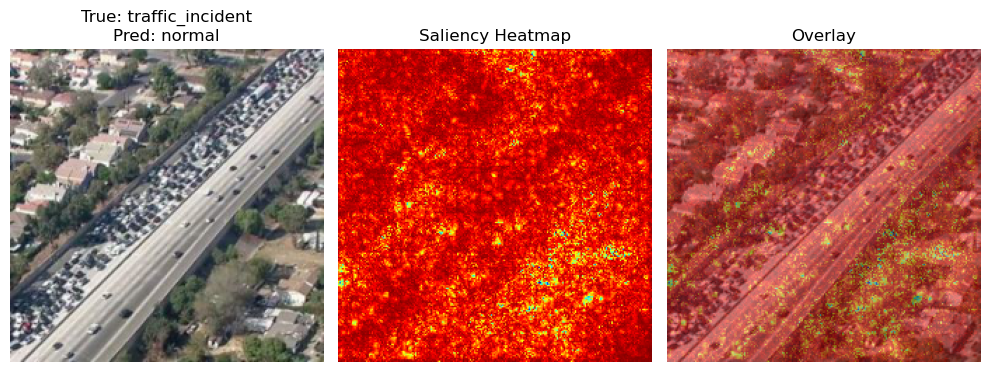

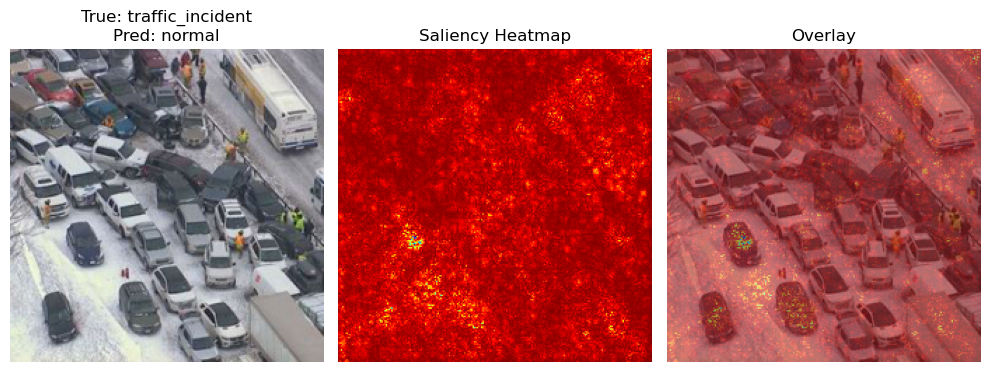

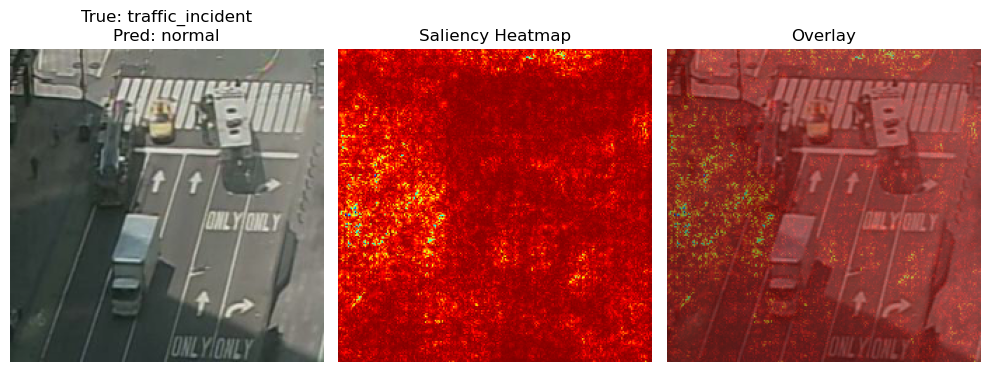

In [9]:
import cv2

def printImage(img_path, true_label, pred_label):
    img = Image.open(img_path).convert('RGB')
    img_tensor = transform(img).unsqueeze(0).to(device)
    saliency_map = get_saliency_map(img_tensor.clone(), pred_label)
    saliency_map = (saliency_map - np.min(saliency_map)) / (np.max(saliency_map) - np.min(saliency_map))

    heatmap = cv2.applyColorMap(np.uint8(255 * saliency_map), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)  

    original_img = np.array(img).astype(np.uint8)  
    original_img = cv2.resize(original_img, (heatmap.shape[1], heatmap.shape[0]))

    if original_img.max() <= 1.0:
        original_img = (original_img * 255).astype(np.uint8)

    if len(heatmap.shape) == 2:
        heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    overlay = cv2.addWeighted(original_img, 0.5, heatmap, 0.5, 0)
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 3, 1)
    plt.title(f"True: {test_dataset.classes[true_label]}\nPred: {test_dataset.classes[pred_label]}")
    plt.imshow(original_img)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Saliency Heatmap")
    plt.imshow(heatmap)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Overlay")
    plt.imshow(overlay)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
for class_name in test_dataset.classes:
    print(f"\n🟢 Correctly classified: {class_name}")
    for sample in correct_by_class[class_name]:
        printImage(*sample)
    print(f"\n🟢 not Correctly classified: {class_name}")
    for sample in incorrect_by_class[class_name]:
        printImage(*sample)


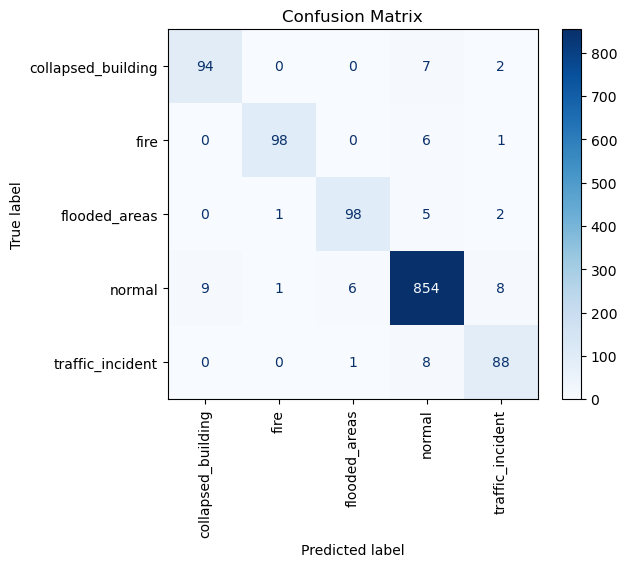

In [10]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_dataset.classes)
disp.plot(xticks_rotation='vertical', cmap='Blues')
plt.title("Confusion Matrix")
plt.show()


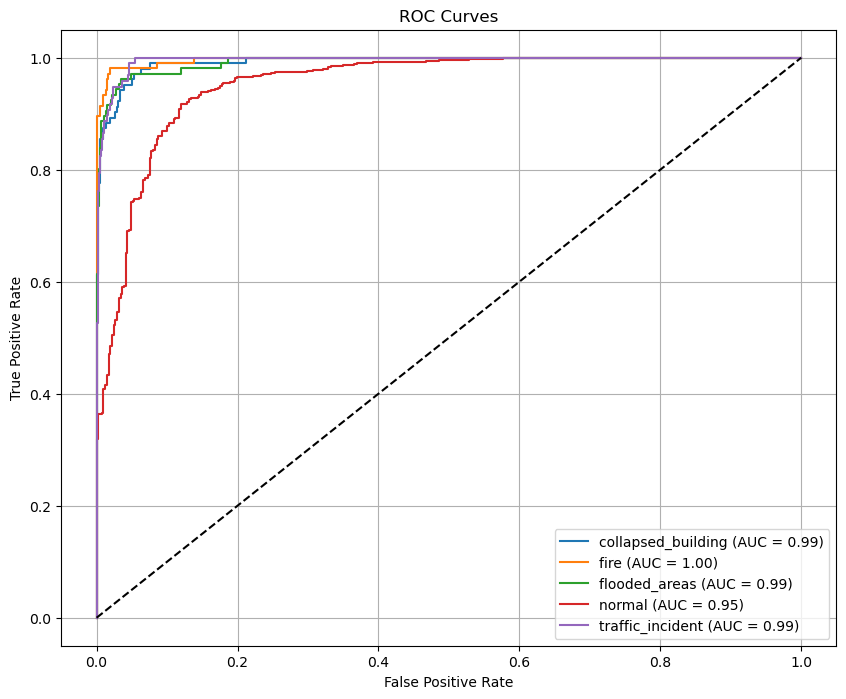

In [13]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

# One-hot encode true labels
y_test_bin = label_binarize(y_test, classes=range(len(test_dataset.classes)))
y_score = clf.decision_function(X_test)

# Plot ROC for each class
fpr = {}
tpr = {}
roc_auc = {}

plt.figure(figsize=(10, 8))
for i in range(len(test_dataset.classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], label=f"{test_dataset.classes[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.title("ROC Curves")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid()
plt.show()


In [15]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'C': [0.01, 0.1, 1, 10],
    'solver': ['liblinear', 'lbfgs']
}

grid = GridSearchCV(LogisticRegression(max_iter=1000, class_weight='balanced'), param_grid, scoring='f1_macro', cv=3)
grid.fit(X_train, y_train)

print("Best parameters found:", grid.best_params_)
clf = grid.best_estimator_

y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred, target_names=test_dataset.classes))


Best parameters found: {'C': 0.1, 'solver': 'liblinear'}
                    precision    recall  f1-score   support

collapsed_building       0.94      0.90      0.92       103
              fire       0.98      0.93      0.96       105
     flooded_areas       0.96      0.94      0.95       106
            normal       0.97      0.98      0.98       878
  traffic_incident       0.87      0.96      0.91        97

          accuracy                           0.96      1289
         macro avg       0.95      0.94      0.94      1289
      weighted avg       0.96      0.96      0.96      1289



Fitting 3 folds for each of 8 candidates, totalling 24 fits
Best Parameters: {'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}
                    precision    recall  f1-score   support

collapsed_building       0.93      0.89      0.91       103
              fire       0.98      0.93      0.96       105
     flooded_areas       0.95      0.93      0.94       106
            normal       0.97      0.98      0.97       878
  traffic_incident       0.88      0.94      0.91        97

          accuracy                           0.96      1289
         macro avg       0.94      0.93      0.94      1289
      weighted avg       0.96      0.96      0.96      1289



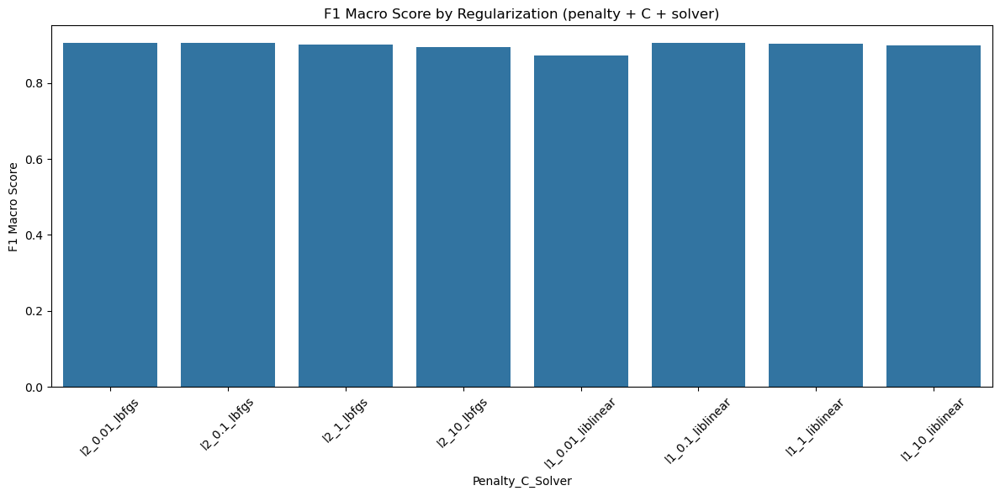

In [19]:
from sklearn.model_selection import GridSearchCV
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

param_grid = [
    {'penalty': ['l2'], 'C': [0.01, 0.1, 1, 10], 'solver': ['lbfgs']},
    {'penalty': ['l1'], 'C': [0.01, 0.1, 1, 10], 'solver': ['liblinear']}
]

grid = GridSearchCV(LogisticRegression(max_iter=1000, class_weight='balanced'),
                    param_grid, scoring='f1_macro', cv=3, verbose=1, n_jobs=-1)
grid.fit(X_train, y_train)

print("Best Parameters:", grid.best_params_)

# Use best model
clf = grid.best_estimator_
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred, target_names=test_dataset.classes))

# Visualization
results = pd.DataFrame(grid.cv_results_)
results['combo'] = results['param_penalty'].astype(str) + "_" + results['param_C'].astype(str) + "_" + results['param_solver']

plt.figure(figsize=(12, 6))
sns.barplot(x="combo", y="mean_test_score", data=results)
plt.xticks(rotation=45)
plt.title("F1 Macro Score by Regularization (penalty + C + solver)")
plt.ylabel("F1 Macro Score")
plt.xlabel("Penalty_C_Solver")
plt.tight_layout()
plt.show()


In [39]:
import os
print(os.getcwd())  # Current working directory


/Users/achuthreddybangaru/Desktop/FDS


Training with lr=0.001, batch_size=32, dropout=0.3
Epoch 1 Validation F1 Score: 0.5594
Epoch 2 Validation F1 Score: 0.5693
Epoch 3 Validation F1 Score: 0.5826
Epoch 4 Validation F1 Score: 0.6277
Epoch 5 Validation F1 Score: 0.5869
Epoch 6 Validation F1 Score: 0.6187
Epoch 7 Validation F1 Score: 0.5838
Early stopping triggered
Training with lr=0.001, batch_size=32, dropout=0.5
Epoch 1 Validation F1 Score: 0.4017
Epoch 2 Validation F1 Score: 0.4889
Epoch 3 Validation F1 Score: 0.5531
Epoch 4 Validation F1 Score: 0.5364
Epoch 5 Validation F1 Score: 0.6191
Epoch 6 Validation F1 Score: 0.6087
Epoch 7 Validation F1 Score: 0.5981
Epoch 8 Validation F1 Score: 0.5587
Early stopping triggered
Training with lr=0.001, batch_size=64, dropout=0.3
Epoch 1 Validation F1 Score: 0.4251
Epoch 2 Validation F1 Score: 0.5334
Epoch 3 Validation F1 Score: 0.4564
Epoch 4 Validation F1 Score: 0.6066
Epoch 5 Validation F1 Score: 0.6262
Epoch 6 Validation F1 Score: 0.6182
Epoch 7 Validation F1 Score: 0.6830
Epoch

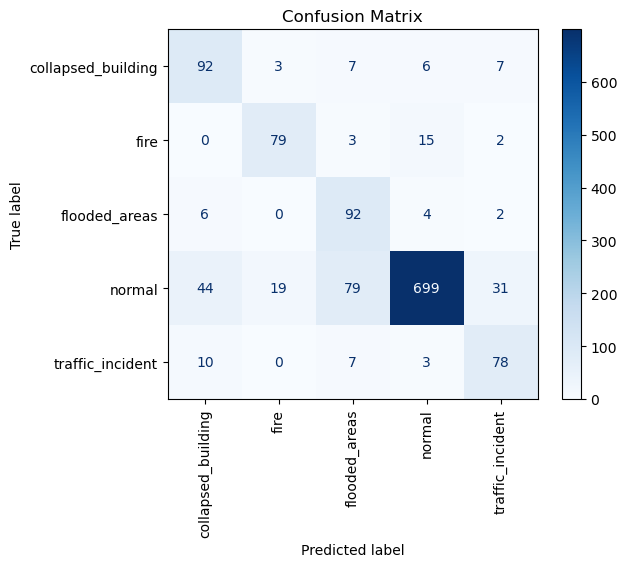

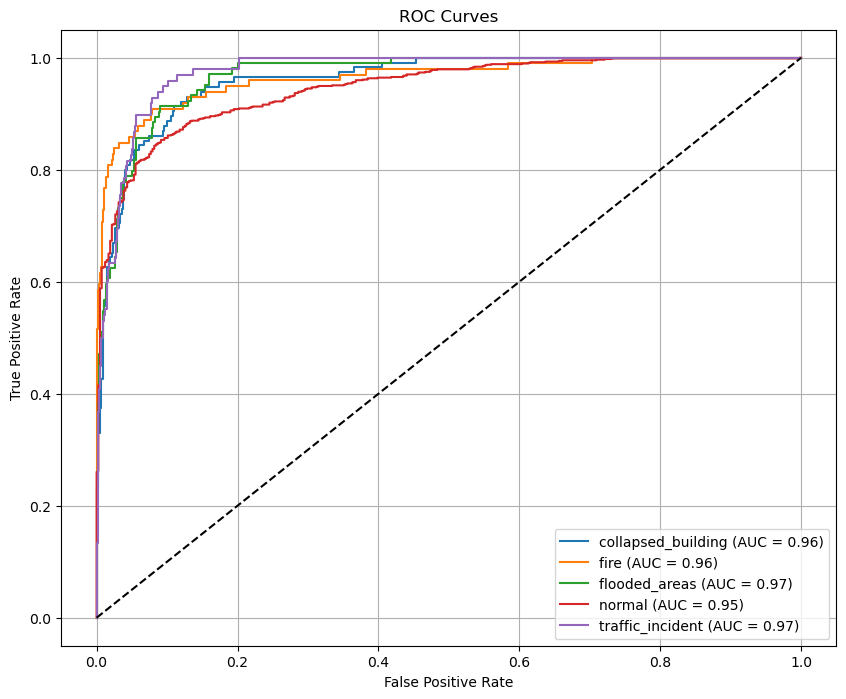

In [47]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, roc_curve, auc, f1_score
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np
from sklearn.utils.class_weight import compute_class_weight

# Image transform with data augmentation and normalization
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Load dataset
dataset = datasets.ImageFolder(root='/Users/achuthreddybangaru/Desktop/FDS/AIDER', transform=transform)
num_classes = len(dataset.classes)

# Train/val/test split
train_size = int(0.6 * len(dataset))
val_size = int(0.2 * len(dataset))
test_size = len(dataset) - train_size - val_size
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

# CNN model with batch normalization and deeper layers
class CNN(nn.Module):
    def __init__(self, dropout=0.5, num_classes=10):
        super(CNN, self).__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
        )
        self.dropout = nn.Dropout(dropout)
        self.fc1 = nn.Linear(128 * 8 * 8, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

# Hyperparameters grid
param_grid = {
    'lr': [0.001, 0.0005],
    'batch_size': [32, 64],
    'dropout': [0.3, 0.5]
}

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
best_f1 = 0
best_model = None
best_params = {}

# Grid search training loop
for lr in param_grid['lr']:
    for bs in param_grid['batch_size']:
        for dr in param_grid['dropout']:
            print(f"Training with lr={lr}, batch_size={bs}, dropout={dr}")
            model = CNN(dropout=dr, num_classes=num_classes).to(device)

            train_loader = DataLoader(train_dataset, batch_size=bs, shuffle=True)
            val_loader = DataLoader(val_dataset, batch_size=bs, shuffle=False)

            # Compute class weights for training
            y_train_labels = [label for _, label in train_dataset]
            class_weights = compute_class_weight('balanced', classes=np.unique(y_train_labels), y=y_train_labels)
            class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
            criterion = nn.CrossEntropyLoss(weight=class_weights)
            optimizer = torch.optim.Adam(model.parameters(), lr=lr)

            patience = 3
            patience_counter = 0
            best_val_f1 = 0

            for epoch in range(20):
                model.train()
                for inputs, labels in train_loader:
                    inputs, labels = inputs.to(device), labels.to(device)
                    optimizer.zero_grad()
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    loss.backward()
                    optimizer.step()

                model.eval()
                all_preds, all_labels = [], []
                with torch.no_grad():
                    for inputs, labels in val_loader:
                        inputs, labels = inputs.to(device), labels.to(device)
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        all_preds.extend(preds.cpu().numpy())
                        all_labels.extend(labels.cpu().numpy())

                f1 = f1_score(all_labels, all_preds, average='macro')
                print(f"Epoch {epoch+1} Validation F1 Score: {f1:.4f}")

                if f1 > best_val_f1:
                    best_val_f1 = f1
                    torch.save(model.state_dict(), 'best_model.pt')
                    patience_counter = 0
                else:
                    patience_counter += 1
                    if patience_counter >= patience:
                        print("Early stopping triggered")
                        break

            if best_val_f1 > best_f1:
                best_f1 = best_val_f1
                best_model = CNN(dropout=dr, num_classes=num_classes).to(device)
                best_model.load_state_dict(torch.load('best_model.pt'))
                best_params = {'lr': lr, 'batch_size': bs, 'dropout': dr}

print("\nBest Params:", best_params)
print("Best F1 on validation:", best_f1)

# Final test evaluation
test_loader = DataLoader(test_dataset, batch_size=best_params['batch_size'], shuffle=False)
all_preds, all_labels = [], []
best_model.eval()
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = best_model(inputs)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

print(classification_report(all_labels, all_preds, target_names=dataset.classes))

# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=dataset.classes)
disp.plot(xticks_rotation='vertical', cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

# ROC Curves
y_test_bin = label_binarize(all_labels, classes=list(range(num_classes)))
y_score = []
with torch.no_grad():
    for inputs, _ in test_loader:
        inputs = inputs.to(device)
        outputs = best_model(inputs)
        probs = F.softmax(outputs, dim=1)
        y_score.extend(probs.cpu().numpy())

y_score = np.array(y_score)
fpr, tpr, roc_auc = {}, {}, {}
plt.figure(figsize=(10, 8))
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], label=f"{dataset.classes[i]} (AUC = {roc_auc[i]:.2f})")
plt.plot([0, 1], [0, 1], 'k--')
plt.title("ROC Curves")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid()
plt.show()
